In [1]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
import pandas as pd
import plotly.express as px 
import pymde
import random
import seaborn as sns
import tensorflow as tf

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import sys
sys.path.append('../../')
from src.instruction_utility import *
from src.data.random_pair_dataset_factory import RandomPairDatasetFactory
from src.data.flat_dataset_factory import FlatDatasetFactory

In [2]:
# load model with weights
# model = load_model_from_metadata('simple_conv2d_embedding_size_32-1.meta') # weird
model = load_model_from_metadata('mobilenet_v2_frozen.meta')

In [3]:
# load instructions
#metadata = load_metadata('simple_conv2d_embedding_size_32-1.meta')  # weird
metadata = load_metadata('mobilenet_v2_frozen.meta')

In [4]:
#
instruction_parser = InstructionParser(metadata["instruction"], is_dict=True)

In [5]:
model_factory = instruction_parser.model_factory

In [6]:
database = load_dataframe("data/processed/category_id_1_min_pair_count_10_deepfashion_train.joblib")

In [7]:
database.head(3)

,index,segmentation,scale,viewpoint,zoom_in,landmarks,style,bounding_box,category_id,occlusion,category_name,image,pair_id,source
22,22,"[[237, 200, 222, 214, 203, 216, 185, 211, 174,...",1,2,1,"[203, 199, 1, 174, 198, 1, 185, 211, 1, 203, 2...",1,"[128, 196, 289, 333]",1,3,short sleeve top,/home/smv/DeepFashion/sustainable_deepfashion/...,4,user
24,24,"[[352, 166, 344, 171, 335, 173, 326, 170, 321,...",1,2,1,"[333, 165, 1, 321, 163, 1, 326, 170, 1, 335, 1...",1,"[299, 162, 367, 228]",1,2,short sleeve top,/home/smv/DeepFashion/sustainable_deepfashion/...,4,shop
26,26,"[[375, 30, 363, 41, 344, 35, 321, 23, 303, 8, ...",2,2,1,"[338, 20, 1, 303, 8, 2, 321, 23, 2, 344, 35, 2...",1,"[209, 4, 412, 205]",1,1,short sleeve top,/home/smv/DeepFashion/sustainable_deepfashion/...,4,shop


In [8]:
factory = FlatDatasetFactory(database, preprocessor=model_factory.preprocessor()) 

In [9]:
model_factory.preprocessor()

<function tensorflow.python.keras.applications.mobilenet_v2.preprocess_input(x, data_format=None)>

In [10]:
data = factory.get_dataset(batch_size=64, shuffle=False)

In [11]:
label_batches = []

for x, y in data:
    label_batches.append(y)

labels = np.concatenate(label_batches)

print(labels.shape)

(47904,)


In [12]:
predictions = model.predict(data)

In [13]:
predictions.shape

(47904, 32)

In [14]:
type(predictions)

numpy.ndarray

In [15]:
#test = np.random.randn(3440, 224, 224, 3) 

In [16]:
predictions

array([[-0.3072078 ,  0.18063276,  0.27033   , ...,  0.30335686,
         0.08261362,  0.04907817],
       [-0.3250484 ,  0.1865829 ,  0.25279048, ...,  0.2941939 ,
         0.09970157,  0.05257465],
       [-0.32016215,  0.18783857,  0.28285822, ...,  0.27571848,
         0.09705976,  0.04637597],
       ...,
       [ 0.12726855,  0.28532508, -0.06274872, ..., -0.065144  ,
         0.01366683, -0.05384305],
       [ 0.18206428,  0.35998702, -0.08071274, ..., -0.00111112,
        -0.09785849, -0.08646403],
       [ 0.16793613,  0.30568612, -0.01630675, ...,  0.02591684,
        -0.03406775, -0.14481227]], dtype=float32)

In [17]:
for x, y in data.take(1):
    images, labels_take_1 = (x+1)/2, y

In [18]:
# images[0]

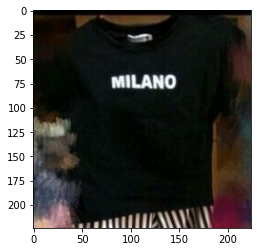

In [19]:
plt.imshow(images[63])

In [20]:
type(images[0])

tensorflow.python.framework.ops.EagerTensor

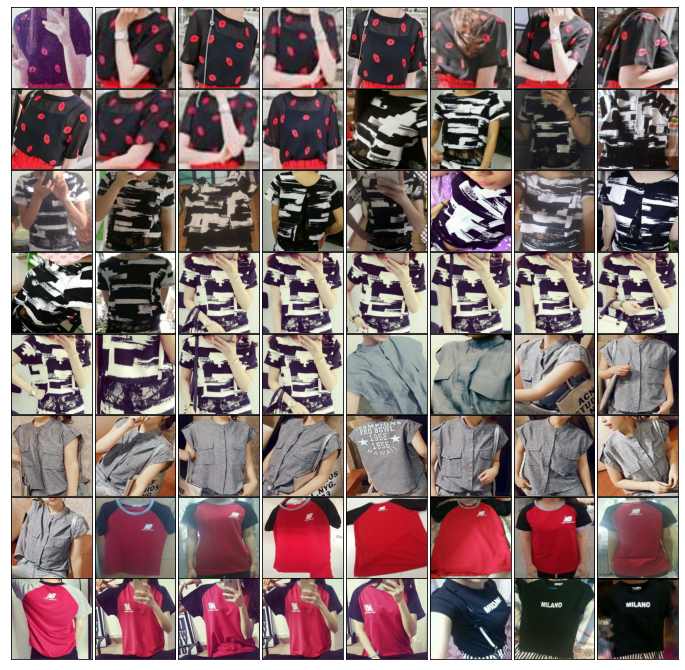

In [21]:
fig, axes = plt.subplots(8, 8, figsize=(12, 12),
                         subplot_kw={'xticks':[],
                                     'yticks':[]}, 
                         gridspec_kw=dict(hspace=0.01, 
                                          wspace=0.01))

for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])

In [22]:
#t_shits = pd.DataFrame([])
#for i, ax in enumerate(axes.flat):
#    t = pd.Series(images[i].flatten())
#  t_shirts = t.append(t)

# PCA

In [23]:
# pca with all components
pca_all = PCA()
pca_all.fit(predictions)
all_components = pca_all.transform(predictions)
pca_all.explained_variance_ratio_

array([0.04623394, 0.04347941, 0.04242133, 0.04136257, 0.04089575,
       0.03936296, 0.03888468, 0.03781181, 0.03698634, 0.03672631,
       0.03537668, 0.03456568, 0.03373355, 0.03289282, 0.03242062,
       0.03144323, 0.03063537, 0.02929954, 0.02900941, 0.02833345,
       0.02750731, 0.02727485, 0.0262687 , 0.02514911, 0.02456848,
       0.02374732, 0.02287655, 0.02206914, 0.02141514, 0.02004364,
       0.01904934, 0.018155  ], dtype=float32)

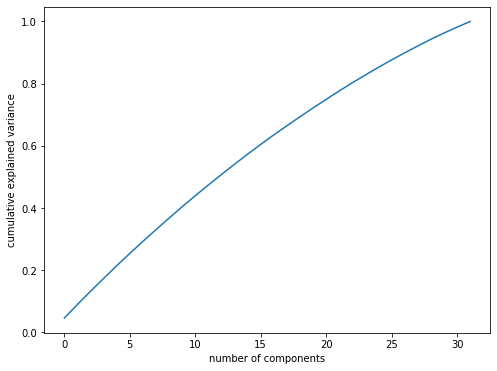

In [24]:
# plot cumulative explained variance ratio as function of the number of components
plt.figure(figsize=(8,6))
plt.plot(np.cumsum(pca_all.explained_variance_ratio_))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.show()
plt.close()

In [25]:
# pca with 3 components
pca = PCA(n_components=3)
pca.fit(predictions)
pca_3comp = pca.transform(predictions)
pca.explained_variance_ratio_

array([0.04582984, 0.04311568, 0.04207885], dtype=float32)

In [26]:
pca.components_

array([[ 1.25942482e-02, -2.58334167e-05,  3.35990310e-01,
         3.15057933e-01,  4.55770567e-02,  2.99424771e-02,
        -1.62455868e-02, -1.51175663e-01,  2.15291545e-01,
        -5.40213252e-04, -2.02942397e-02, -2.35177074e-02,
         3.05785853e-02,  7.93721452e-02,  8.16283822e-02,
        -9.55771878e-02, -4.66218404e-02, -1.17857128e-01,
         2.94025928e-01,  1.07241191e-01,  3.37582737e-01,
        -1.24920510e-01,  1.68138966e-01, -2.93861702e-02,
        -2.96181738e-01, -2.60626465e-01, -9.91133600e-02,
         6.89496696e-02,  2.95473367e-01, -2.12990716e-01,
         2.74907202e-01, -2.00153217e-01],
       [-3.51115495e-01, -2.51930803e-01,  1.22254893e-01,
         1.21402508e-02,  2.96376139e-01, -2.01854348e-01,
         3.35479736e-01, -1.43624723e-01,  2.40092780e-02,
        -1.39764369e-01,  3.07400692e-02,  2.86507607e-01,
        -1.85345605e-01, -2.19872743e-01,  8.14740136e-02,
        -2.20115572e-01,  1.42744198e-01,  1.68090850e-01,
        -1.74

In [27]:
# create a dataframe with pca results
#pca_df = pd.DataFrame(shirts_pca, columns = ['pc1','pc2'], index=database.index)
pca_df = pd.DataFrame(pca_3comp, columns = ['pc1','pc2', 'pc3'], index=database.index)
pca_df.head(3)

,pc1,pc2,pc3
22,-0.020345,-0.065373,0.040595
24,-0.013308,-0.065117,0.033801
26,-0.003422,-0.071028,0.049826


In [28]:
print(labels.shape)

(47904,)


In [29]:
# number of unique labels: pair-ids
len(np.unique(labels))

1873

In [30]:
# Label to color dict (automatic)
label_color_dict = {label:idx for idx,label in enumerate(np.unique(labels))}

# Color vector creation
cvec = [label_color_dict[label] for label in labels]

In [31]:
# plot a 2d pca results for n_number of pair_ids
#fig = px.scatter(pca_3comp, 
#                 x=pca_3comp[:, 0], 
#                 y=pca_3comp[:, 1], 
#                 range_x=(-0.8, 0.8), 
#                 range_y=(-0.8, 0.8), 
#                 color=cvec, 
#                 width=700, 
#                 height=600,
#                 opacity=0.6
#)
#fig.show()

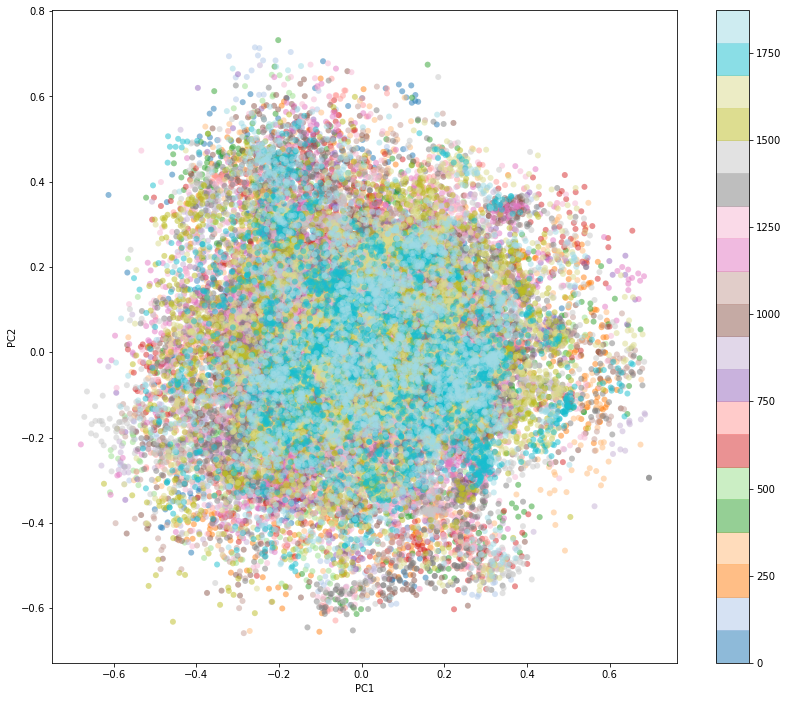

In [32]:
# plot 2 pca components
plt.figure(figsize=(14, 12))
plt.scatter(pca_3comp[:, 0], pca_3comp[:, 1],
            c=cvec,
            edgecolor='none', 
            alpha=0.5,
            cmap=plt.cm.get_cmap('tab20')
           )
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.colorbar();

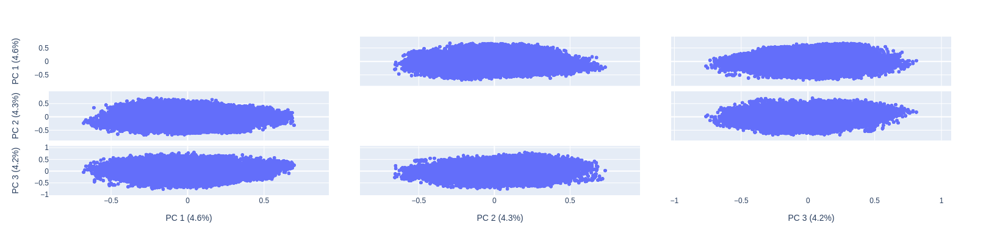

In [33]:
labels_pca = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    pca_3comp,
    labels=labels_pca,
    dimensions=range(3),
    #color=cvec,
    width=600, 
    height=400, 
)
fig.update_traces(diagonal_visible=False)
fig.show()

In [34]:
database["pair_id"].nunique()

2592

In [35]:
# add the column pair_id to the pca dataframe
pca_df['pair_id'] = database["pair_id"]

In [36]:
# number of random numbers to be generated
#n_number = 40 

# there are 2592 unique pair_ids
#lower_bound = 0
#upper_bound = 2591

# generate n_number of random numbers representing pair_ids
#rand_20_num = [random.randint(lower_bound, upper_bound) for a in range(n_number)]

# create a dataframe containing the randomly selected pair
#rnd_pair_pca = pca_df[database["pair_id"].isin(rand_20_num)]

#plt.rcParams['font.size'] = 16
#plt.figure(figsize=(10, 8))
#plt.scatter(rnd_pair_pca.pc1, rnd_pair_pca.pc2,
#            c=rnd_pair_pca.pair_id,
#            edgecolor='none', 
#            alpha=1,
#            cmap=plt.cm.get_cmap('tab20')
#           )
#plt.xlim([-0.8, 0.8])
#plt.ylim([-0.8, 0.8])
#plt.xlabel('PC1')
#plt.ylabel('PC2')
#plt.colorbar();

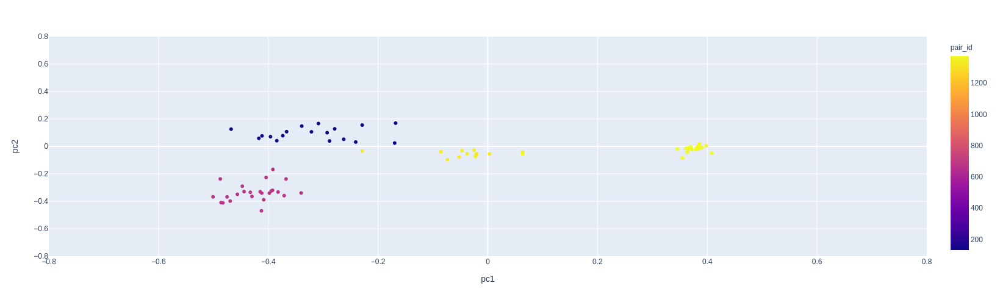

In [37]:
# number of random numbers to be generated
n_number = 40 

# there are 2592 unique pair_ids
lower_bound = 0
upper_bound = 2591

# generate n_number of random numbers representing pair_ids
rand_20_num = [random.randint(lower_bound, upper_bound) for a in range(n_number)]

# create a dataframe containing the randomly selected pair
rnd_pair_pca = pca_df[database["pair_id"].isin(rand_20_num)]

# plot a 2d pca results for n_number of pair_ids
fig = px.scatter(rnd_pair_pca, 
                 x="pc1", 
                 y="pc2", 
                 range_x=(-0.8, 0.8), 
                 range_y=(-0.8, 0.8), 
                 color='pair_id', 
                 width=600, 
                 height=500
)
fig.show()

In [41]:
# plot a 3d pca results for n_number of pair_ids
total_var = pca.explained_variance_ratio_.sum() * 100

fig = px.scatter_3d(
    rnd_pair_pca, x='pc1', y='pc2', z='pc3', color='pair_id',
   # title=f'Total Explained Variance: {total_var:.2f}%',
    labels={'0': 'PC 1', '1': 'PC 2', '2': 'PC 3'},
    opacity=0.6,
    width =700,
    height=700
    
)
fig.update_traces(marker=dict(size=4,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers')
)
fig.show()

In [40]:
pca_df.head()

,pc1,pc2,pc3,pair_id
22,-0.020345,-0.065373,0.040595,4
24,-0.013308,-0.065117,0.033801,4
26,-0.003422,-0.071028,0.049826,4
27,-0.023268,-0.088677,0.048680,4
29,-0.013615,-0.046996,0.054297,4


# Pymde library

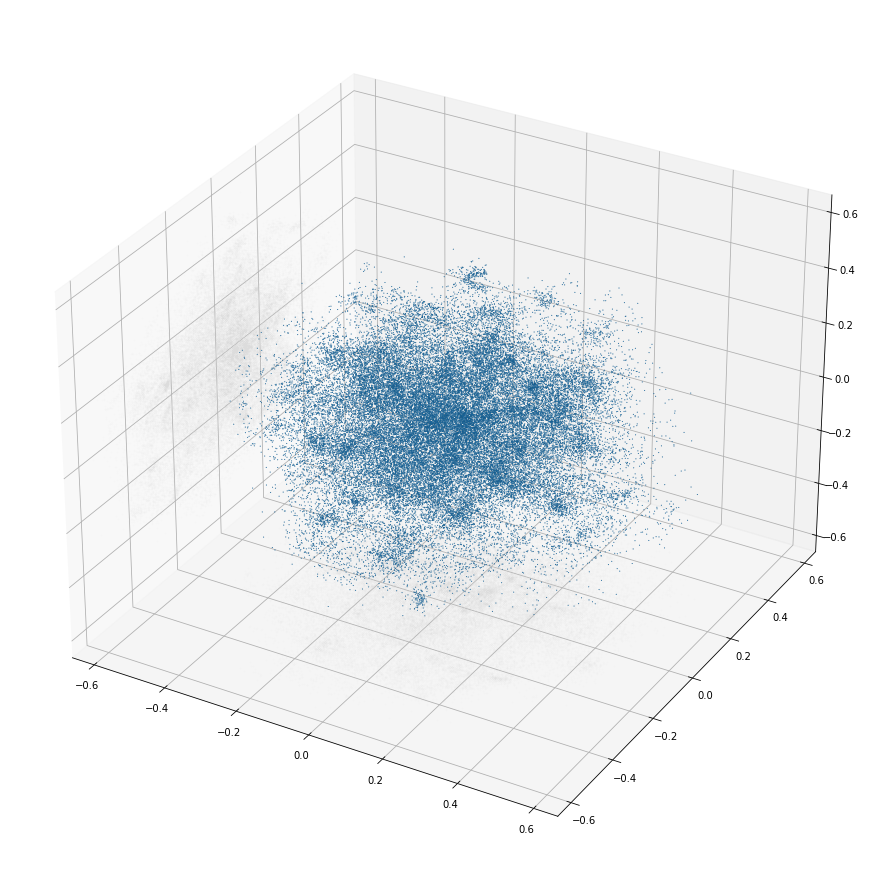

In [39]:
#pred = pymde.datasets.Dataset(images, labels)
#embedding = pymde.preserve_neighbors(pred.data, verbose=True).embed()
pymde.plot(predictions, color_map='viridis', figsize_inches=(12., 12.))